テンソルフロー分類

In [189]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [2]:
import tensorflow  as tf
print("version", tf.__version__)

version 2.12.0


In [3]:
import tensorflow_hub as hub

In [4]:
print("gpu" if tf.config.list_physical_devices("gpu") else "not available :(")

not available :(


・Google Colabの無料版では、利用可能なGPUは制限されています。多くのユーザーが同時にGPUを利用している場合、GPUリソースが一時的に利用できなくなることがあります。時間をおいてから再度試すか、Google Colab Proにアップグレードして、より多くのリソースを利用できるようにすることを検討してください。

・GoogleアカウントがGPUの利用制限に達している場合、GPUが利用できなくなります。Google Colabでは、一定の時間枠内でGPUの使用が制限されています。時間をおいてから再度試すか、別のGoogleアカウントでログインしてみてください。


以上の理由からGPUが使用できない可能性あり。使用可能時間帯を調査したい

In [5]:
import os
import psutil

process = psutil.Process(os.getpid())
mem_info = process.memory_info()

print(f"RAM used: {mem_info.rss / (1024 * 1024)} MB")


RAM used: 600.6875 MB


cpu使用状況プログラム実行

In [9]:
import pandas as pd
label_csv = pd.read_csv("/content/drive/MyDrive/SKfolder/labels.csv")
print(label_csv.describe())
print(label_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


describe()メソッドから得られる情報:


count: 各列の要素数 (10222)
unique: 各列のユニークな要素数（id列では10222、breed列では120）
top: 各列で最も頻繁に出現する値（id列では "000bec180eb18c7604dcecc8fe0dba07"、breed列では "scottish_deerhound"）
freq: 各列の最頻値の出現回数（id列では1、breed列では126）:

<Axes: >

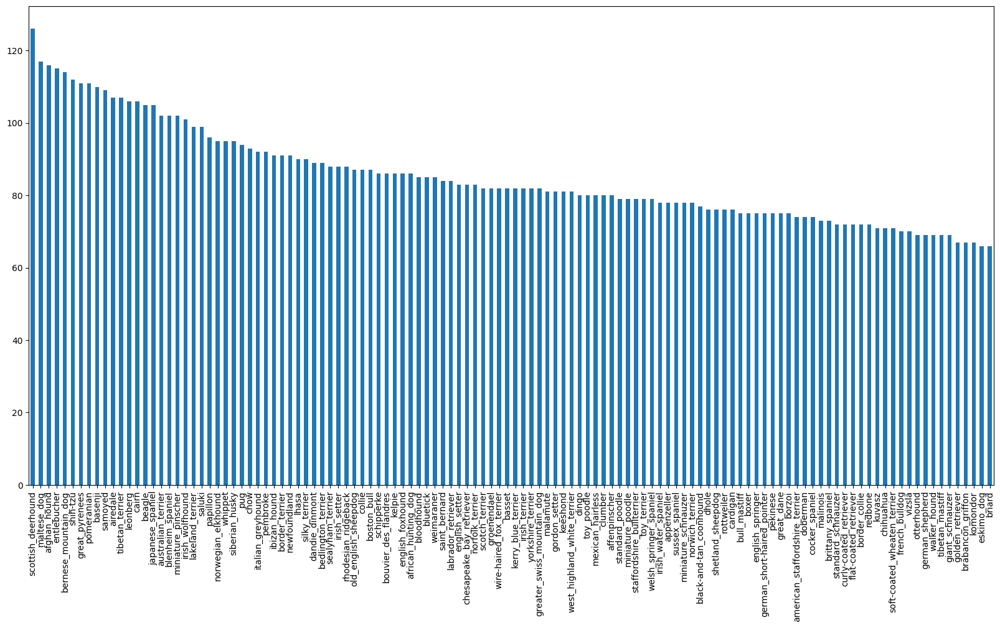

In [10]:
label_csv["breed"].value_counts().plot.bar(figsize=(20, 10))

In [11]:
label_csv["breed"].value_counts().median()

82.0

google autoMlで使用されるサンプル数が10~100を基準としているとされ、中央値から、許容範囲内と判断

解凍を試みるが何回やっても解凍できず、別の解凍プログラムを実行しても解凍ができない。どうやらアップロードに時間がかなりかかっているらしい。スピード的には10%アップロードするのに5分程度かかっている。データサイズによってはかなりの時間を要するみたいで、proプランであればもっと早くなるのだろうか。

ランタイムが切れたにも関わらず、なぜか解凍がうまくいった。なぜ。。

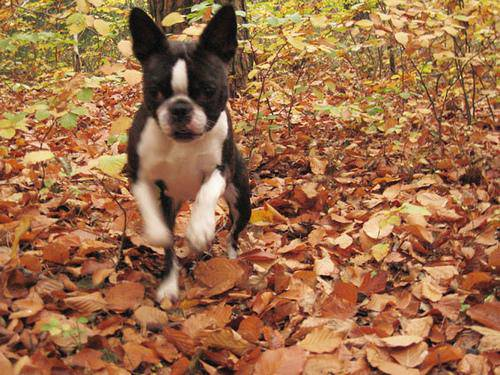

In [12]:
from IPython.display import Image
Image("/content/drive/MyDrive/SKfolder/train/000bec180eb18c7604dcecc8fe0dba07.jpg")

In [13]:
filenames = ["/content/drive/MyDrive/SKfolder/train/" + fname + ".jpg" for fname in label_csv["id"]]

filenames[:10]

['/content/drive/MyDrive/SKfolder/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/MyDrive/SKfolder/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/drive/MyDrive/SKfolder/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/drive/MyDrive/SKfolder/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/drive/MyDrive/SKfolder/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '/content/drive/MyDrive/SKfolder/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 '/content/drive/MyDrive/SKfolder/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '/content/drive/MyDrive/SKfolder/train/002a283a315af96eaea0e28e7163b21b.jpg',
 '/content/drive/MyDrive/SKfolder/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 '/content/drive/MyDrive/SKfolder/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

トレーニングデータと正解データのデータ量が一致しているかの確認作業


In [14]:
import os
if len(os.listdir("/content/drive/MyDrive/SKfolder/train")) == len(filenames):
  print("sucsses")
else:
  print("fail")

sucsses


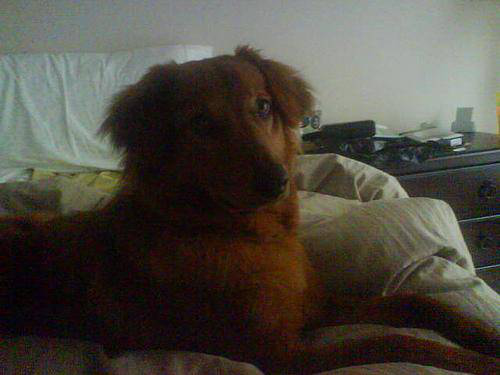

In [15]:
from PIL import Image

img = Image.open(filenames[1000])
img.show()


In [16]:
import os

path = "/content/drive/MyDrive/SKfolder/train"
file_list = os.listdir(path)

print(file_list)

['e278e285726d3ec4b737d80cc891d266.jpg', 'e26c0ce9c297f9abc3b16c37cd48a133.jpg', 'e507c47a34012fb435804f89797b6abb.jpg', 'e0c2b69fc53eeb74dfbf31a1ce54b11a.jpg', 'dbc7b27136e58946665a82f4ff6209ba.jpg', 'dc068bd9527c4b3d7cf62fa73ae23bbe.jpg', 'dfd42ce694fd4af24a71392b94176b56.jpg', 'dd126e42b474c3831f8fda33052428c1.jpg', 'dd9aae7acb992593e07aa905ff4e5ca4.jpg', 'dc28c131838c21c74b77e2c4f411fd4b.jpg', 'e91b2802897234af87d09702a6b23b16.jpg', 'de9c66567290fc6574e102d21dc3a957.jpg', 'db80c33cdf2c6723380d77e0f7bc7abe.jpg', 'dcc865c3a438f9d0f8588dd7d1e0aa09.jpg', 'de2c9754f0687fc8d0922b990d274777.jpg', 'ddf85ff807c96d56f25b420fcaa121fe.jpg', 'e3cc185776379b55e23a9973bce785b7.jpg', 'e07277bc6a6a0da06598b3ad43a011b2.jpg', 'dfc97c3d7a59ad4d89e791e6ab14c49f.jpg', 'df8895a945ab874f4a9cdd451aebc011.jpg', 'e97b337794ab4b95db5e2622156de547.jpg', 'e42d24760fcb9e6273a29e2f083ba9b6.jpg', 'e0acf08c678ede145c9824dbb7c3718e.jpg', 'e79011daac807552f798aa1effb60ee4.jpg', 'e8d0712b9ca47f77b333858183a38ef7.jpg',

In [17]:
print(filenames[0])


/content/drive/MyDrive/SKfolder/train/000bec180eb18c7604dcecc8fe0dba07.jpg


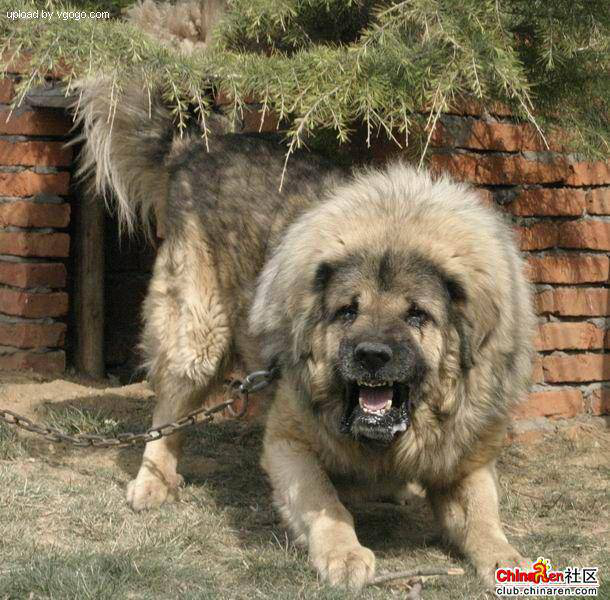

In [18]:
from PIL import Image
from IPython.display import display

img = Image.open(filenames[9000])
display(img)


In [19]:
1+1

2

In [20]:
label_csv["breed"][9000]

'tibetan_mastiff'

In [21]:
import numpy as np
labels = label_csv["breed"]
labels = np.array(labels)
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [22]:
len(labels)

10222

In [23]:
filenames[:10]

['/content/drive/MyDrive/SKfolder/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/MyDrive/SKfolder/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/drive/MyDrive/SKfolder/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/drive/MyDrive/SKfolder/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/drive/MyDrive/SKfolder/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '/content/drive/MyDrive/SKfolder/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 '/content/drive/MyDrive/SKfolder/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '/content/drive/MyDrive/SKfolder/train/002a283a315af96eaea0e28e7163b21b.jpg',
 '/content/drive/MyDrive/SKfolder/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 '/content/drive/MyDrive/SKfolder/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [24]:
labels[:10]

array(['boston_bull', 'dingo', 'pekinese', 'bluetick', 'golden_retriever',
       'bedlington_terrier', 'bedlington_terrier', 'borzoi', 'basenji',
       'scottish_deerhound'], dtype=object)

In [25]:
if len(labels) == len(filenames):
 print("sucsses")
else:
 print("error")

sucsses


In [26]:
unique_breeds = np.unique(labels)
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [27]:
print(labels[10])
labels[10] == unique_breeds


shetland_sheepdog


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
        True, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [28]:
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

label for labels の labelは自動に定義されるリスト内包表記のこと

In [29]:
print(labels[0])
print(np.where(unique_breeds == labels[0]))
print(boolean_labels[0].argmax())
print(boolean_labels[0].astype(int))

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


検証セットがないので作成
全体の10~20%くらいのデータから抽出を始める


In [30]:
x = filenames
y = boolean_labels

In [31]:
NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max:10000}

In [32]:
from sklearn.model_selection import train_test_split

x_train, x_val, y_train, y_val = train_test_split(x[:NUM_IMAGES],
                                                                  y[:NUM_IMAGES],
                                                                  test_size = 0.2,
                                                                  random_state = 42)

len(x_train), len(x_val), len(y_train), len(y_val)

(800, 200, 800, 200)

検証データが抽出できたののか再度確認

In [33]:
x_train[:2], y_train[:2]

(['/content/drive/MyDrive/SKfolder/train/00bee065dcec471f26394855c5c2f3de.jpg',
  '/content/drive/MyDrive/SKfolder/train/0d2f9e12a2611d911d91a339074c8154.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, Fal

上段と下段に分かれているのは、表示の問題です。y_trainは、各画像に対応するone-hotエンコーディングされたラベルを持つ配列のリストです。このリスト内の配列はすべて、同じ長さ（犬種の数に等しい）を持ちます。この例での上段と下段の違いは、リスト内の2つの異なる要素（2つの異なる画像に対応するラベル）を表示しているだけで、特別な意味はありません。

In [34]:
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

In [35]:
image[:2]

array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]]], dtype=uint8)

In [36]:
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]]], dtype=uint8)>

In [37]:
IMG_SIZE = 224
def process_image(image_path, img_size=IMG_SIZE):
  image = tf.io.read_file(image_path)
  image = tf.image.decode_jpeg(image, channels=3)
  image = tf.image.convert_image_dtype(image, tf.float32)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])
  return image

In [38]:
tensor = tf.io.read_file(filenames[20])
tensor

<tf.Tensor: shape=(), dtype=string, numpy=b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x00\x00\x01\x00\x01\x00\x00\xff\xdb\x00C\x00\n\x07\x07\x08\x07\x06\n\x08\x08\x08\x0b\n\n\x0b\x0e\x18\x10\x0e\r\r\x0e\x1d\x15\x16\x11\x18#\x1f%$"\x1f"!&+7/&)4)!"0A149;>>>%.DIC<H7=>;\xff\xdb\x00C\x01\n\x0b\x0b\x0e\r\x0e\x1c\x10\x10\x1c;("(;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;\xff\xc0\x00\x11\x08\x01w\x01\xf4\x03\x01"\x00\x02\x11\x01\x03\x11\x01\xff\xc4\x00\x1f\x00\x00\x01\x05\x01\x01\x01\x01\x01\x01\x00\x00\x00\x00\x00\x00\x00\x00\x01\x02\x03\x04\x05\x06\x07\x08\t\n\x0b\xff\xc4\x00\xb5\x10\x00\x02\x01\x03\x03\x02\x04\x03\x05\x05\x04\x04\x00\x00\x01}\x01\x02\x03\x00\x04\x11\x05\x12!1A\x06\x13Qa\x07"q\x142\x81\x91\xa1\x08#B\xb1\xc1\x15R\xd1\xf0$3br\x82\t\n\x16\x17\x18\x19\x1a%&\'()*456789:CDEFGHIJSTUVWXYZcdefghijstuvwxyz\x83\x84\x85\x86\x87\x88\x89\x8a\x92\x93\x94\x95\x96\x97\x98\x99\x9a\xa2\xa3\xa4\xa5\xa6\xa7\xa8\xa9\xaa\xb2\xb3\xb4\xb5\xb6\xb7\xb8\xb9\xba\xc2\xc3\xc4\xc5\xc6\xc7\xc8\xc9\xca

In [39]:
tensor = tf.image.decode_jpeg(tensor, channels=3)[:2]

In [40]:
tf.image.convert_image_dtype(tensor, tf.float32)

<tf.Tensor: shape=(2, 500, 3), dtype=float32, numpy=
array([[[0.4901961 , 0.5019608 , 0.45882356],
        [0.47450984, 0.48627454, 0.4431373 ],
        [0.44705886, 0.47058827, 0.42352945],
        ...,
        [0.37647063, 0.48627454, 0.25490198],
        [0.37254903, 0.48235297, 0.2509804 ],
        [0.38823533, 0.49803925, 0.26666668]],

       [[0.454902  , 0.4666667 , 0.42352945],
        [0.43921572, 0.46274513, 0.4156863 ],
        [0.427451  , 0.45098042, 0.4039216 ],
        ...,
        [0.36862746, 0.4784314 , 0.2392157 ],
        [0.36078432, 0.47058827, 0.23137257],
        [0.37254903, 0.48235297, 0.24313727]]], dtype=float32)>

0~1の間にノーマライズしなければディーブラーニングできない？

In [41]:
def get_image_label(image_path, label):

  image = process_image(image_path)
  return image, label

In [42]:
(process_image(x[42]), tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

In [43]:
BATCH_SIZE = 32

def create_data_batch(x, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
    if test_data:
        print("Creating test data batch")
        data = tf.data.Dataset.from_tensor_slices(tf.constant(x))
        data_batch = data.map(process_image).batch(BATCH_SIZE)
        return data_batch
        print()

    elif valid_data:
        print("Creating validation data batch")
        data = tf.data.Dataset.from_tensor_slices((tf.constant(x), tf.constant(y)))
        data_batch = data.map(get_image_label).batch(BATCH_SIZE)
        return data_batch

    else:
        print("Creating training data batch")
        data = tf.data.Dataset.from_tensor_slices((tf.constant(x), tf.constant(y)))
        data = data.shuffle(buffer_size=len(x))
        data = data.map(get_image_label)
        data_batch = data.batch(BATCH_SIZE)
        return data_batch



# **プログラムの解説**

create_data_batch関数を定義します。この関数は、与えられた画像データとラベルから、バッチ処理されたデータセットを作成します。また、バッチサイズ、データが検証用か、テスト用かどうかを制御するフラグも含まれています。

ifブロック: テストデータ用のデータバッチを作成します。from_tensor_slicesメソッドを使用して、画像データのテンソルスライスデータセットを作成し、process_image関数を使って画像を前処理します。最後に、batchメソッドを使用して、バッチサイズに応じてデータセットをバッチ化します。これがテストデータバッチです。

elifブロック: 検証データ用のデータバッチを作成します。from_tensor_slicesメソッドを使用して、画像データとラベルのテンソルスライスデータセットを作成します。get_image_label関数を使って、画像とラベルのペアを作成し、batchメソッドを使用して、バッチサイズに応じてデータセットをバッチ化します。これが検証データバッチです。

elseブロック: トレーニングデータ用のデータバッチを作成します。from_tensor_slicesメソッドを使用して、画像データとラベルのテンソルスライスデータセットを作成します。shuffleメソッドを使用して、データセットをシャッフルし、get_image_label関数を使って、画像とラベルのペアを作成します。最後に、batchメソッドを使用して、バッチサイズに応じてデータセットをバッチ化します。これがトレーニングデータバッチです。



In [44]:
train_data = create_data_batch(x_train, y_train)
val_data = create_data_batch(x_val, y_val, valid_data=True)

Creating training data batch
Creating validation data batch


バッチ処理にて、分割してトレーニング、検証、テストそれぞれの画像でテンソルフローのconstantモジュールを使いながら、スライスしていった


In [45]:
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

In [46]:
import matplotlib.pyplot as plt

def show_25_image(image, label):

  plt.figure(figsize=(10, 10))
  for i in range(25):
    ax = plt.subplot(5, 5, i+1)
    plt.imshow(image[i])
    plt.title(unique_breeds[label[i].argmax()])
    plt.axis("off")


show_25_image 関数は、25枚の画像と対応するラベルをグリッド状に表示する関数です。

plt.figure(figsize=(10, 10)) は、10x10 の大きさの図を作成します。
for i in range(25): で、25枚の画像に対してループを実行します。
ax = plt.subplot(5, 5, i+1) は、5x5 のグリッドの i+1 番目のサブプロットを作成します。
plt.imshow(image[i]) は、i 番目の画像を表示します。
plt.title(unique_breeds[label[i].argmax()]) は、i 番目の画像のラベルをタイトルとして設定します。ここでは、label[i].argmax() で、ラベルの配列で最も高いインデックスを取得し、unique_breeds 配列から対応する文字列を取得しています。
plt.axis("off") は、各サブプロットの軸を非表示にします。
train_image, train_label = next(train_data.as_numpy_iterator()) は、訓練データセットから次のバッチを取得します。この場合、バッチサイズは32です。

len(train_image), len(train_label) は、取得したバッチの画像とラベルの数を表示します。これは (32, 32) になります。

show_25_image(train_image, train_label) は、show_25_image 関数を呼び出して、取得した画像とラベルを表示します。ただし、実際には32枚の画像がありますが、この関数は最初の25枚の画像だけを表示します。

In [47]:
train_image, train_label = next(train_data.as_numpy_iterator())
len(train_image), len(train_label)


(32, 32)

# **プログラムの説明**

train_data.as_numpy_iterator() は、データセットのイテレータを作成し、next() 関数を呼び出すことで、次のバッチのデータ（画像とラベル）を取得します。すでに train_data がシャッフルされている場合、as_numpy_iterator() を呼び出すたびに、シャッフルされたデータセットから新しいバッチが取得されます。

train_image, train_label = next(train_data.as_numpy_iterator()) を複数回実行することで、シャッフルされたデータセットから異なるバッチの画像とラベルが取得されます。このため、この行を繰り返し実行すると、異なるシャッフル結果が表示されます。

この挙動は、train_data がシャッフルされているために起こります。シャッフルされていないデータセットで同じ操作を行った場合、同じバッチが繰り返し表示されることになります。

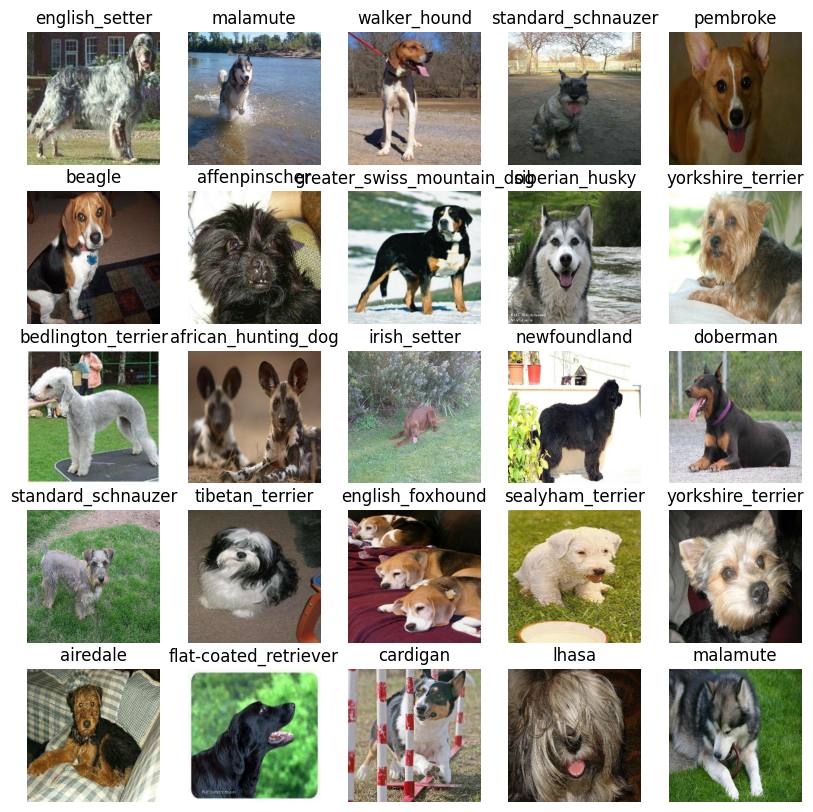

In [48]:
show_25_image(train_image, train_label)

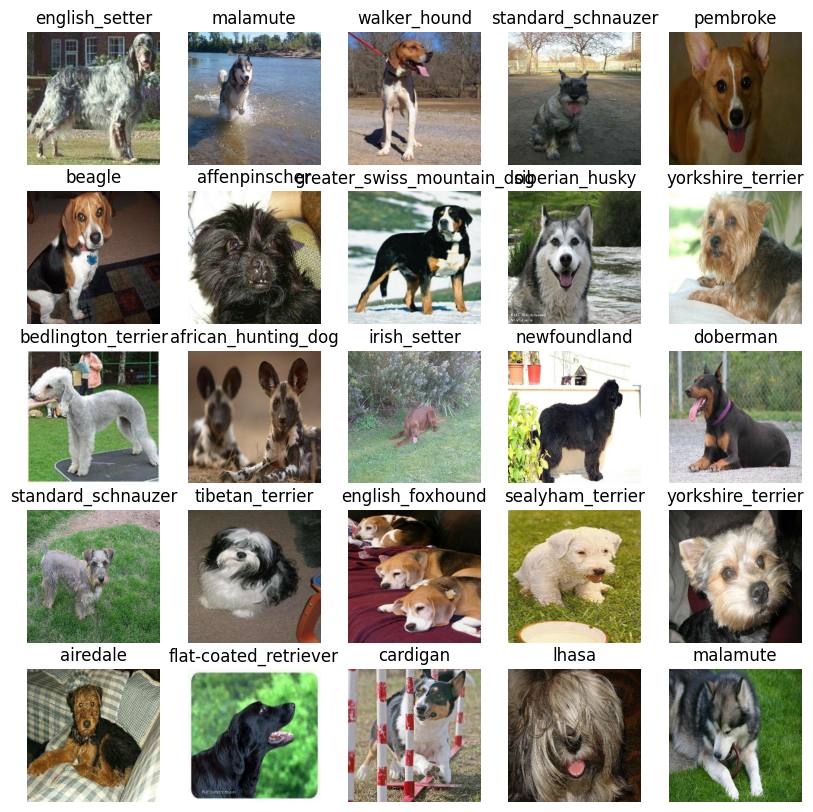

In [49]:
show_25_image(train_image, train_label)


# **定数テンソルの説明**


定数テンソルは、値が変更されないテンソル（多次元配列）です。テンソルの値が 0 から 1 の範囲に収まるかどうかは、定数テンソルの定義とは関係ありません。

定数テンソルは、tf.constant 関数を使用して作成され、その後、値が変更されることはありません。定数テンソルは、任意の形状やデータ型の数値データを格納できます。例えば、以下のような定数テンソルを作成することができます。

python
Copy code
import tensorflow as tf

# スカラー（0次元テンソル）
scalar_tensor = tf.constant(42)

# ベクトル（1次元テンソル）
vector_tensor = tf.constant([1, 2, 3, 4, 5])

# 行列（2次元テンソル）
matrix_tensor = tf.constant([[1, 2], [3, 4], [5, 6]])
これらの定数テンソルは、ニューラルネットワークや他の機械学習モデルの入力データ、パラメータ初期値、または計算に使用される定数値など、さまざまな目的で使用されます。






In [50]:
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3]

OUTPUT_SHAPE = len(unique_breeds)

MODEL_URL = "https://tfhub.dev/google/tf2-preview/mobilenet_v2/classification/4"

In [51]:

def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
    print("Building model")

    model = tf.keras.Sequential([
        hub.KerasLayer(model_url),
        tf.keras.layers.Dense(units=output_shape, activation="softmax")
    ])

    model.compile(
        loss=tf.keras.losses.CategoricalCrossentropy(),
        optimizer=tf.keras.optimizers.Adam(),
        metrics=["accuracy"]
    )

    model.build(input_shape)
    return model


tf.keras.Sequential を使用して、モデルの構造を定義します。このモデルは次の 2 つのレイヤーで構成されています。

hub.KerasLayer(model_url): TensorFlow Hub から指定された URL の事前学習済みモデル（model_url）をダウンロードして追加します。このモデルは特徴抽出器として機能します。
tf.keras.layers.Dense(units=output_shape, activation="softmax"): 出力層として、output_shape ユニット数の全結合層（Dense）を追加します。活性化関数としてソフトマックス関数を使用します。
model.compile() を呼び出して、モデルのコンパイルを行います。ここでは、損失関数として CategoricalCrossentropy を使用し、最適化アルゴリズムとして Adam を使用し、評価指標として正解率（accuracy）を指定しています。

最後に、model.build(input_shape) を呼び出して、モデルを構築し、入力形状を指定します。これにより、モデルの重みが初期化されます。

構築されたモデルを返します。このモデルは、訓練や評価に使用することができます。

In [52]:
 model = create_model()
 model.summary()

Building model
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              3540265   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 3,660,505
Trainable params: 120,240
Non-trainable params: 3,540,265
_________________________________________________________________


ここでの "denseの120クラス（犬の品種）にマッピングします" とは、ニューラルネットワークの最後の層（Dense層）で、入力された特徴量を120種類の犬の品種それぞれの確率に変換することを意味しています。具体的には、Dense層は入力された特徴量を、120個の出力ユニットそれぞれに対応する重みとバイアスを用いて線形変換し、その後ソフトマックス関数を適用して各品種の確率に変換します。

前回の説明で、12240という数字が紹介されたことはありませんでした。ただし、モデルのパラメータ数に関連する数字として、120240という数字があります。これはDense層の重みとバイアスの総数を表しています。具体的には、最後のDense層には1001個の入力ユニット（EfficientNetからの出力）と120個の出力ユニット（犬の品種の数）があります。そのため、重みの数は 1001 * 120 = 120120 で、加えて120個のバイアスがあるため、合計で 120120 + 120 = 120240 のパラメータがあります。










# User
#重みとバイアスを用いて線形変換が1001個の入力ユニットに当たるという理解ですね


ChatGPT
はい、その理解が正確です。最後のDense層では、1001個の入力ユニット（EfficientNetからの出力）が、重みとバイアスを用いて線形変換されます。線形変換の結果として、120個の出力ユニット（犬の品種の数に対応）が得られます。その後、ソフトマックス関数が適用され、120個の出力ユニットそれぞれが犬の品種の確率に変換されます。

ニューラルネットワークでは、バイアスは線形変換の後に活性化関数が適用される前に追加される定数です。バイアスが重要な理由は、ネットワークの表現力を向上させるためです。

線形変換のみ（重みと入力の積の和）では、データに潜む複雑なパターンを捉えることが難しい場合があります。バイアスを追加することで、線形変換の結果を適切にオフセット（シフト）することができます。

このオフセットにより、活性化関数がより効果的に働く範囲に線形変換の結果を調整することができます。つまり、バイアスはネットワークが非線形関数を適切に活用できるようにするための役割があります。

例えば、シグモイド活性化関数は、入力値が0付近のときに最も急な変化を示します。そのため、バイアスを調整して線形変換の結果がこの範囲に入るようにすることで、シグモイド関数がより効果的に機能します。

バイアスは、学習プロセス中に最適化アルゴリズムによって自動的に調整されます。これにより、モデルはデータセットの特徴をより適切に捉え、精度を向上させることができます。





# User
# 活性化関数を計算する際に、純粋な線形変換の数では計算しにくいため、定数、つまりはオフセット（バイアス）を使用して計算しやすくするという理解でいいでしょうか


ChatGPT
はい、その理解で正しいです。活性化関数を適用する前にバイアス（オフセット）を加えることで、線形変換の結果が活性化関数の効果的な範囲にシフトされます。これにより、モデルがデータの非線形特性をより適切に捉えることができ、精度が向上します。

バイアスは、学習プロセス中に最適化アルゴリズムによって自動的に調整され、ネットワークの表現力が向上します。





Regenerate response




In [53]:
%load_ext tensorboard


%load_ext tensorboard は、Jupyter Notebook や Google Colab で TensorBoard を使用するために必要なマジックコマンドです。

TensorBoard は、TensorFlow の視覚化ツールで、モデルの学習時に生成されるデータ（スカラー値、画像、オーディオ、グラフなど）を視覚化するのに役立ちます。主にモデルの学習プロセスを監視し、最適化、デバッグ、およびモデルアーキテクチャの改善に役立てることができます。

%load_ext tensorboard は、Jupyter Notebook や Google Colab に TensorBoard 拡張機能をロードするためのコマンドです。このコマンドを実行することで、ノートブック内で TensorBoard を実行することができます。

In [54]:
import datetime
def create_tensorboard_callback():
  logdir = os.path.join("/content/drive/MyDrive/SKfolder/logs",
                                datetime.datetime.now().strftime("%Y%M%D-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

import datetime は、Python の標準ライブラリである datetime モジュールをインポートしています。このモジュールは、日付や時刻を操作するために使用されます。

create_tensorboard_callback() 関数は、TensorBoard のコールバックを作成する関数です。この関数は、以下の処理を行っています。

logdir のパスを作成します。このパスは、TensorBoard のログが保存されるディレクトリです。os.path.join を使って、/content/drive/MyDrive/SKfolder/logs と現在の日時（年月日-時分秒）を結合しています。これにより、各学習実行のログが異なるディレクトリに保存されるようになります。

tf.keras.callbacks.TensorBoard(logdir) を使って、TensorBoard のコールバックを作成しています。logdir 引数には、先程作成したログディレクトリのパスを指定します。これにより、学習時に各エポックごとのステータスが logdir に保存されます。

最終的に、この関数は作成された TensorBoard コールバックを返します。このコールバックは、モデルの fit() メソッドで使用され、学習中に TensorBoard のログが保存されるようになります。これにより、TensorBoard を使用して学習の進行状況を監視することができます。





User
---------------------------------------------------------------------------
AttributeError                            Traceback (most recent call last)
<ipython-input-21-7cf1fb078bdc> in <cell line: 1>()
----> 1 early_stopping = tf.keras.callbacks.Earlystopping(monitor = "val_accuracy",
      2                                                                         patience = 3)

AttributeError: module 'keras.api._v2.keras.callbacks' has no attribute 'Earlystopping'
early_stopping = tf.keras.callbacks.Earlystopping(monitor = "val_accuracy",
                                                                        patience = 3)

解消して下さい
ChatGPT
エラーが発生しているのは、Earlystopping という属性が存在しないためです。正しい属性名は EarlyStopping です。以下のように修正してください。

python
Copy code
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                   patience=3)
これで、エラーが解消されるはずです。





User
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                   patience=3)

解説お願いします
ChatGPT
early_stopping という変数に、tf.keras.callbacks.EarlyStopping コールバックをインスタンス化しています。このコールバックは、ニューラルネットワークの学習中に過学習を防ぐために使用されます。

monitor="val_accuracy": この引数は、監視対象のパフォーマンス指標を指定します。この場合、検証データセットの正解率（val_accuracy）が監視対象となります。
patience=3: この引数は、学習を中止するまでの許容回数を指定します。この例では、patience が 3 に設定されているため、検証データセットの正解率が 3 エポック連続で改善されない場合、学習が早期に停止されます。
このコールバックをモデルの fit() 関数に渡すことで、学習中に条件に応じて学習が早期に停止されるようになります。これにより





In [55]:
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                   patience=3)


In [56]:
print("GPU", "YESSS" if tf.config.list_physical_devices("GPU") else "fail")

GPU YESSS


GPUが使用されているか確認した

In [57]:
NUM_EPOCHS = 60 #@param {type: "slider", min: 10, max: 100, step: 10}

In [58]:
def train_model():

  model = create_model()

  tensorboard = create_tensorboard_callback()

  model.fit(x=train_data,
                epochs=NUM_EPOCHS,
                validation_data=val_data,
                validation_freq=1,
                callbacks=[tensorboard, early_stopping])
  
  return model

train_model() 関数の説明を以下に記載します。

create_model() 関数を呼び出してモデルを作成し、model という変数に格納します。
create_tensorboard_callbacks() 関数を呼び出して TensorBoard のコールバックを作成し、tensorboard という変数に格納します。
model.fit() を呼び出してモデルを訓練します。以下の引数が渡されています。
x=train_data: 訓練データを指定します。
epochs=NUM_EPOCHS: エポック数を指定します。NUM_EPOCHS は事前に設定された定数です。
validation_data=val_data: 検証データを指定します。
validation_freq=1: 検証の実行頻度を指定します。1 に設定されているため、各エポックの終了後に検証が実行されます。
callbacks=[tensorboard, early_stopping]: モデルの訓練中に実行されるコールバックのリストを指定します。この場合、TensorBoard コールバックと早期停止コールバックが使用されます。
訓練が完了したモデルを返します。
validation_freq の意味について説明します。validation_freq は、検証の実行頻度を制御する引数です。この例では、validation_freq が 1 に設定されているため、各エポックの終了後に検証が実行されます。これにより、モデルのパフォーマンスを正確に監視することができます。

validation_freq を大きな値に設定すると、検証の実行頻度が低くなり、計算コストが削減されますが、モデルのパフォーマンスの変化を正確に把握できなくなる可能性があります。逆に、validation_freq を小さな値に設定すると、検証の実行頻度が高くなり、モデルのパフォーマンスの変化をより正確に把握できますが、計算コストが増加します。





# User
#トレーニング後の検証という意味でしょうか

ChatGPT
はい、その通りです。validation_freq は、モデル訓練中に検証を実行する頻度を制御します。この例では validation_freq=1 が設定されているため、各エポックの終了後に検証が実行されます。

検証データを使用して検証を行うことで、モデルが訓練データだけでなく、未知のデータに対しても適切に予測できるかどうかを評価できます。この評価が、モデルの一般化性能（新しいデータに対する性能）を把握するのに役立ちます。また、過学習や学習不足の兆候を検出するためにも使用されます。





Regenerate response


よくここまで辿り着いた! よくやった自分!


In [59]:
model = train_model()

Building model
Epoch 1/60
25/25 [==============================] - 148s 5s/step - loss: 4.7221 - accuracy: 0.0913 - val_loss: 3.3024 - val_accuracy: 0.3000
Epoch 2/60
25/25 [==============================] - 2s 61ms/step - loss: 1.5987 - accuracy: 0.7025 - val_loss: 2.0601 - val_accuracy: 0.5600
Epoch 3/60
25/25 [==============================] - 2s 62ms/step - loss: 0.5327 - accuracy: 0.9388 - val_loss: 1.6489 - val_accuracy: 0.6000
Epoch 4/60
25/25 [==============================] - 2s 85ms/step - loss: 0.2369 - accuracy: 0.9887 - val_loss: 1.4797 - val_accuracy: 0.6300
Epoch 5/60
25/25 [==============================] - 2s 61ms/step - loss: 0.1362 - accuracy: 0.9975 - val_loss: 1.4150 - val_accuracy: 0.6600
Epoch 6/60
25/25 [==============================] - 2s 60ms/step - loss: 0.0930 - accuracy: 0.9987 - val_loss: 1.3789 - val_accuracy: 0.6750
Epoch 7/60
25/25 [==============================] - 2s 61ms/step - loss: 0.0705 - accuracy: 1.0000 - val_loss: 1.3599 - val_accuracy: 0.675

トレーニングデータ800にバッチサイズ32

In [60]:
800/32

25.0

In [61]:
%tensorboard --logdir /content/drive/MyDrive/SKfolder/logs --port 6007

<IPython.core.display.Javascript object>

オーバーフィッティグされている

In [62]:
prediction = model.predict(val_data, verbose=1)
prediction

7/7 [==============================] - 1s 53ms/step


array([[2.3542666e-03, 1.3883201e-03, 1.3193046e-04, ..., 3.0423561e-04,
        9.0370289e-05, 5.1437658e-03],
       [4.7025401e-03, 4.8008738e-03, 4.1948170e-03, ..., 1.0569882e-04,
        1.8860193e-03, 2.9915200e-05],
       [4.5724155e-06, 1.5426835e-04, 1.4007419e-06, ..., 2.2136361e-05,
        2.7796639e-05, 6.6757505e-04],
       ...,
       [1.8008006e-05, 2.1149162e-05, 1.0200124e-05, ..., 1.7003612e-06,
        4.3819487e-05, 3.1209758e-05],
       [2.0378140e-04, 1.0697215e-05, 1.3423245e-06, ..., 4.1748795e-06,
        1.5767253e-05, 1.9567567e-03],
       [3.6608416e-04, 4.6777794e-05, 6.0624775e-04, ..., 3.1320276e-03,
        7.8505185e-04, 8.5745682e-04]], dtype=float32)

In [63]:
np.sum(prediction[0])

1.0

In [64]:
index = 0
print(prediction[0])
print(f"Max value: {np.max(prediction[index])}")
print(f"Sum: {np.sum(prediction[index])}")
print(f"Max index: {np.argmax(prediction[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(prediction[index])]}")


[2.35426659e-03 1.38832012e-03 1.31930457e-04 1.38237941e-04
 5.16545144e-04 7.28833140e-04 4.42880839e-02 3.31275136e-04
 8.08646611e-04 3.02548491e-04 3.06258764e-04 1.46014645e-04
 3.80662997e-04 1.99388480e-04 1.02495587e-05 2.67783878e-03
 2.70730583e-04 7.19987601e-02 1.94672793e-05 6.51565555e-04
 4.94922604e-03 1.73938589e-03 2.33467035e-05 3.44852940e-03
 5.47490126e-05 5.97071426e-04 1.47369251e-01 3.75949283e-04
 1.45990751e-03 7.27612933e-04 7.41806056e-04 3.67233576e-03
 1.77002192e-04 1.10951536e-04 3.75303898e-05 3.67840333e-03
 7.10467721e-05 2.73556652e-04 6.97784635e-05 3.74939205e-04
 4.74949891e-04 3.11052390e-05 5.50423192e-06 8.36348161e-03
 4.34423477e-04 4.37546842e-04 6.64545514e-05 1.46933703e-03
 7.17848539e-03 9.22585663e-04 1.50141685e-04 1.40122851e-04
 1.35402416e-03 6.06590929e-03 3.00891770e-05 8.26851756e-05
 7.70339466e-05 5.00960508e-04 2.30142163e-04 4.17858995e-02
 8.07102246e-04 1.39306486e-03 2.09998153e-03 1.43779735e-05
 2.66762043e-04 1.434484

In [93]:
def get_pred_label(prediction_probabilities):
    return unique_breeds[np.argmax(prediction_probabilities)]

pred_label = get_pred_label(prediction[0])
print(pred_label)


lhasa


In [67]:
images_ = []
labels_ = []

for image, label in val_data.unbatch().as_numpy_iterator():
    images_.append(image)
    labels_.append(label)

In [90]:
def unbatchify(data):

 images = []
 labels = []

 for image, label in data.unbatch().as_numpy_iterator():
  images.append(image)
  labels.append(unique_breeds[np.argmax(label)])
 return images, labels

val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

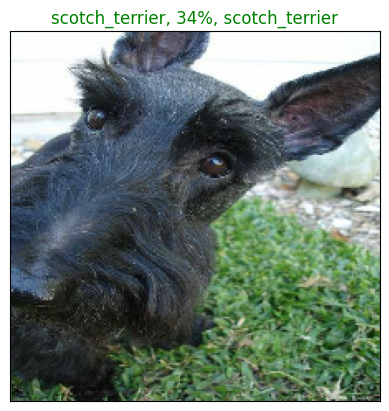

In [97]:
def plot_pred(prediction_probabilities, labels, images, n=1):
    pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

    pred_label = get_pred_label(pred_prob)

    plt.imshow(image)
    plt.xticks([])
    plt.yticks([])

    if pred_label == true_label:
        color = "green"
    else:
        color = "red"

    plt.title("{}, {:2.0f}%, {}".format(pred_label,
                                       np.max(pred_prob) * 100,  # This line now shows the prediction probability
                                       true_label),
                                       color=color)

plot_pred(prediction_probabilities=prediction,
          labels=val_labels,
          images=val_images)


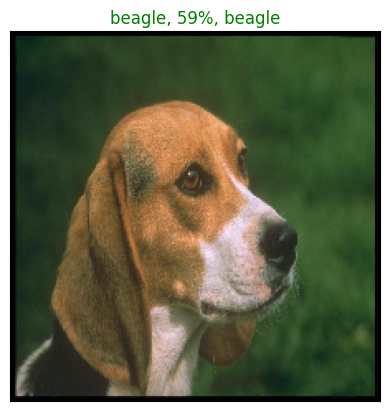

In [103]:
plot_pred(prediction_probabilities=prediction,
               labels=val_labels,
               images=val_images,
               n=120)

In [104]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
    pred_prob, true_label = prediction_probabilities[n], labels[n]
    pred_label = get_pred_label(pred_prob)
    top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
    top_10_pred_values = pred_prob[top_10_pred_indexes]
    top_10_pred_labels = unique_breeds[top_10_pred_indexes]

    top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                       top_10_pred_values,
                       color="gray")

    plt.xticks(np.arange(len(top_10_pred_labels)),
               top_10_pred_labels,
               rotation="vertical")

    if np.isin(true_label, top_10_pred_labels):
        top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
    else:
        pass


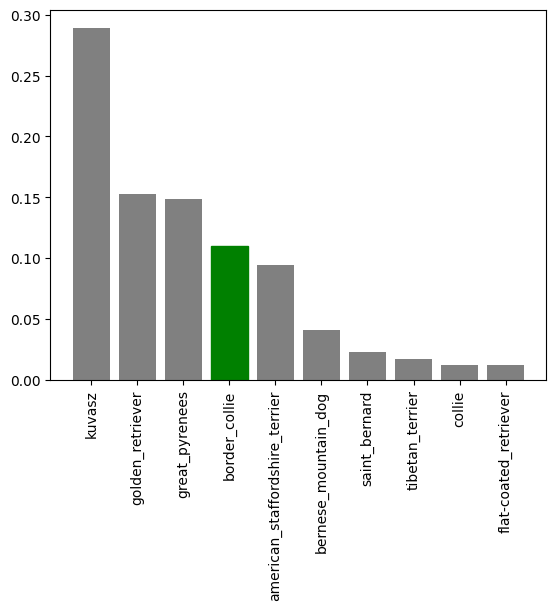

In [105]:
plot_pred_conf(prediction_probabilities=prediction,
               labels=val_labels,
               n=11)


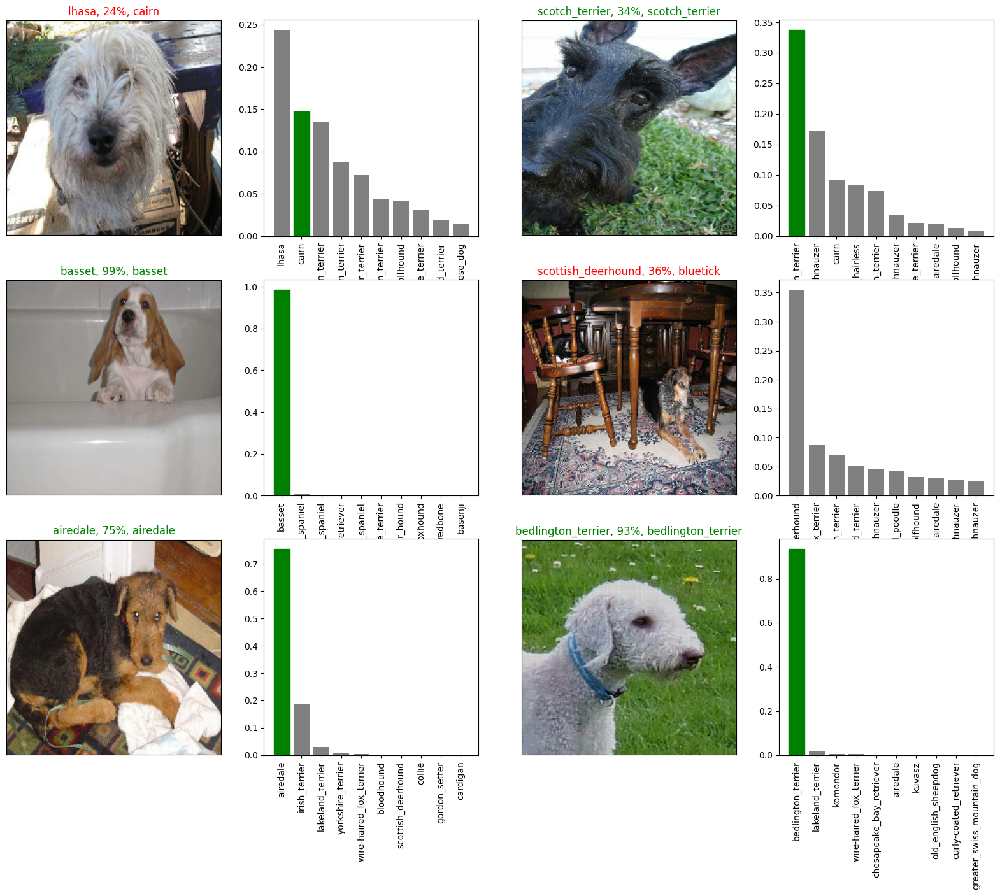

In [108]:
i_multiplier = 0
num_rows = 3
num_cols = 2
num_images = num_rows * num_cols
plt.figure(figsize=(10 * num_cols, 5 * num_rows))
for i in range(num_images):
    plt.subplot(num_rows, 2 * num_cols, 2 * i + 1)
    plot_pred(prediction_probabilities=prediction,
              labels=val_labels,
              images=val_images,
              n=i + i_multiplier)
    plt.subplot(num_rows, 2 * num_cols, 2 * i + 2)
    plot_pred_conf(prediction_probabilities=prediction,
                   labels=val_labels,
                   n=i + i_multiplier)

plt.show()


In [109]:
def save_model(model, suffix=None):
    modeldir = os.path.join("/content/drive/MyDrive/SKfolder/models",
                            datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
    
    if suffix:
        model_path = modeldir + "-" + suffix + ".h5"
    else:
        model_path = modeldir + ".h5"
        
    print(f"saving: {model_path}")
    model.save(model_path)
    return model_path

In [110]:
def load_model(model_path):
  print(f"load: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model


In [111]:
save_model(model, suffix="/content/drive/MyDrive/SKfolder/models/20235505/03/23-045535-Adam2.h5")

saving: /content/drive/MyDrive/SKfolder/models/20230504-061051-/content/drive/MyDrive/SKfolder/models/20235505/03/23-045535-Adam2.h5.h5


'/content/drive/MyDrive/SKfolder/models/20230504-061051-/content/drive/MyDrive/SKfolder/models/20235505/03/23-045535-Adam2.h5.h5'

In [118]:
loaded_1000_image_model = load_model("/content/drive/MyDrive/SKfolder/models/20230805/03/23-040851-adam.h5")

load: /content/drive/MyDrive/SKfolder/models/20230805/03/23-040851-adam.h5


In [114]:
model.evaluate(val_data)


7/7 [==============================] - 0s 52ms/step - loss: 1.2795 - accuracy: 0.6950


[1.2795474529266357, 0.6949999928474426]

In [119]:
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 1s 65ms/step - loss: 1.2971 - accuracy: 0.6950


[1.297132968902588, 0.6949999928474426]

In [121]:
full_data = create_data_batch(x, y)

Creating training data batch


In [122]:
full_model = create_model()

Building model


In [123]:
full_model_tensorboard = create_tensorboard_callback()
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
patience=3)

In [128]:
full_model.fit(train_data,
                    epochs=NUM_EPOCHS,
                    validation_data=val_data,
                    callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/60
25/25 [==============================] - 6s 88ms/step - loss: 4.5749 - accuracy: 0.0862 - val_loss: 3.4120 - val_accuracy: 0.2550
Epoch 2/60
25/25 [==============================] - 2s 67ms/step - loss: 1.5314 - accuracy: 0.6975 - val_loss: 2.1172 - val_accuracy: 0.5150
Epoch 3/60
25/25 [==============================] - 2s 65ms/step - loss: 0.5053 - accuracy: 0.9450 - val_loss: 1.6448 - val_accuracy: 0.6450
Epoch 4/60
25/25 [==============================] - 2s 77ms/step - loss: 0.2275 - accuracy: 0.9937 - val_loss: 1.4988 - val_accuracy: 0.6600
Epoch 5/60
25/25 [==============================] - 2s 84ms/step - loss: 0.1316 - accuracy: 0.9975 - val_loss: 1.4330 - val_accuracy: 0.6650
Epoch 6/60
25/25 [==============================] - 2s 69ms/step - loss: 0.0904 - accuracy: 0.9987 - val_loss: 1.3952 - val_accuracy: 0.6550
Epoch 7/60
25/25 [==============================] - 2s 67ms/step - loss: 0.0686 - accuracy: 1.0000 - val_loss: 1.3679 - val_accuracy: 0.6600
Epoch 8/60
25

In [131]:
len(full_data)

320

In [132]:
save_model(full_model, suffix="/content/drive/MyDrive/SKfolder/models/20235505/03/23-045535-Adam3.h5")

saving: /content/drive/MyDrive/SKfolder/models/20230504-062108-/content/drive/MyDrive/SKfolder/models/20235505/03/23-045535-Adam3.h5.h5


'/content/drive/MyDrive/SKfolder/models/20230504-062108-/content/drive/MyDrive/SKfolder/models/20235505/03/23-045535-Adam3.h5.h5'

In [135]:
loaded_full_model = load_model("/content/drive/MyDrive/SKfolder/models/20230504-062108-/content/drive/MyDrive/SKfolder/models/20235505/03/23-045535-Adam3.h5.h5")

load: /content/drive/MyDrive/SKfolder/models/20230504-062108-/content/drive/MyDrive/SKfolder/models/20235505/03/23-045535-Adam3.h5.h5


In [146]:
test_path = "/content/drive/MyDrive/SKfolder/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['/content/drive/MyDrive/SKfolder/test/e35b90290702042d17ceee2aaf2d1475.jpg',
 '/content/drive/MyDrive/SKfolder/test/e05367db91d0449b2afe76a1b7acc1c8.jpg',
 '/content/drive/MyDrive/SKfolder/test/dd3ac0ab0e9328f1f4c1692947c17c09.jpg',
 '/content/drive/MyDrive/SKfolder/test/e3b9e9c903bbcf09fc0da06efabaec1c.jpg',
 '/content/drive/MyDrive/SKfolder/test/e09a3a40b2ebdf0be72800eefd6931de.jpg',
 '/content/drive/MyDrive/SKfolder/test/debfa5cad80e35c510dff6ca29b94ca3.jpg',
 '/content/drive/MyDrive/SKfolder/test/e2844bf76c0ddeae02277d76c31e41f5.jpg',
 '/content/drive/MyDrive/SKfolder/test/e0c11786a50ce49abdb71397d711ecc9.jpg',
 '/content/drive/MyDrive/SKfolder/test/e2628b6bde028b5eb593616128728907.jpg',
 '/content/drive/MyDrive/SKfolder/test/e1e6d180a31b0a9c0d741d0f142ea6af.jpg']

In [147]:
test_data = create_data_batch(test_filenames, test_data=True)

Creating test data batch


In [148]:
test_predictions = loaded_full_model.predict(test_data,
                                                                   verbose=1)

324/324 [==============================] - 1551s 5s/step


In [153]:
preds_df = pd.DataFrame(columns=["id"] + list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [155]:
test_ids = [os.path.splitext(path) for path in os.listdir(test_path)]
preds_df["id"] = test_ids

In [157]:
preds_df[list(unique_breeds)] = test_predictions

In [207]:
custom_path = "/content/drive/MyDrive/SKfolder/dogs/"
custom_image_paths = [os.path.join(custom_path, fname) for fname in os.listdir(custom_path) if not fname.startswith('.') and os.path.isfile(os.path.join(custom_path, fname))]

In [208]:
custom_image_paths

['/content/drive/MyDrive/SKfolder/dogs/dog.jpeg']

In [209]:
custom_data = create_data_batch(custom_image_paths, test_data=True)
custom_data

Creating test data batch


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [210]:
custom_preds = loaded_full_model.predict(custom_data)


1/1 [==============================] - 0s 446ms/step


array([[1.75921028e-04, 1.65285437e-05, 2.71052195e-05, 1.12289948e-04,
        3.05332686e-03, 1.81710161e-03, 1.33922382e-04, 1.12240817e-02,
        3.52017560e-05, 1.64850251e-04, 9.81072026e-06, 1.16954528e-04,
        4.64373967e-04, 1.11725205e-03, 2.56057101e-04, 8.63639056e-04,
        3.98980992e-05, 3.87199601e-04, 1.18153356e-03, 1.36817456e-04,
        1.80343868e-05, 6.02491316e-04, 7.28812942e-04, 5.20034655e-06,
        2.71554780e-03, 1.38353334e-05, 1.03818355e-04, 5.09667152e-04,
        3.93126480e-04, 5.66603336e-03, 1.14312517e-02, 3.92180773e-05,
        1.76941248e-05, 2.01286690e-04, 4.88508318e-04, 6.03390043e-04,
        5.74220438e-04, 1.58327650e-02, 1.41847322e-05, 1.85908546e-04,
        7.64980941e-05, 2.22669274e-04, 1.07937853e-03, 2.86796596e-02,
        9.33995121e-04, 4.30824060e-04, 1.14109826e-04, 9.60084071e-05,
        1.37154639e-04, 8.18515383e-03, 8.99458901e-05, 5.50469616e-04,
        2.94278696e-04, 1.33252528e-04, 4.41735348e-04, 1.512091

In [211]:
custom_preds.shape

(1, 120)

In [212]:
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['siberian_husky']

In [218]:
custom_images = []
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

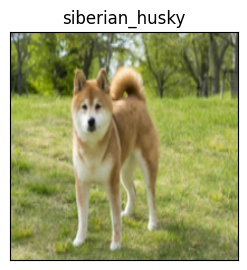

In [222]:
plt.figure(figsize=(10, 10))
for i, image in enumerate(custom_images):
  plt.subplot(1, 3, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)